# Анализ рынка заведений общественного питания Москвы.

# Описание проекта

Инвесторы из очень уважаемого и известного фонда решили открыть заведение общественного питания в Москве. Правда они еще не решили какое. Поэтому они обратились в наш аналитический отдел , чтобы мы сделали анализ рынка и презентовали им особенности рынка , чтобы помочь им определится. Одно из условий : презентация должна быть информативной и лаконичной. 

Чтобы провести такой анализ , мы воспользуемся датасетом с заведениями общественного питания Москвы, составленным на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

В ходе исследования мы планируем воспользоваться файлом  moscow_places.csv

Поэтапно мы планируем сделать следующие шаги:

-  Загрузить данные и изучите общую информацию
-  Выполнить предобработку данных
-  Провести Анализ данных
-  Детализируем исследование: открытие кофейни
-  Подготовим презентацию

### Загрузим данные и изучим общую информацию

Для начала загрузим все нужные библиотеки ( вначале я могу все и не включить, но по мере выполнения проекта при необходимости я буду возвращаться  к этому шагу, чтобы дополнить их и в итоге все загруженные библиотеки будут в 1 месте).

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
from plotly import graph_objects as go
from IPython.display import set_matplotlib_formats
import json
import folium
from folium.plugins import MarkerCluster
from folium import Map, Marker

Теперь загрузим датасет

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

Пропишем, чтобы не было ограничений по столбцам и названиям в них.

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
pd.options.display.max_colwidth = 130

In [5]:
pd.set_option('display.max_rows', None)

Выберем как будут отображаться все наши графики.

In [6]:
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":200, 'savefig.dpi':300})
sns.set_context('notebook')  
sns.set_style("ticks")

Посмотрим, какие у нас данные.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [8]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [9]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Итак, что мы видим на первый взгляд.

У нас 14 колонок, в которых данные по:
-	название заведения;
-	адрес заведения;
-	категория заведения, например «кафе», «пиццерия» или «кофейня»;
-	информация о днях и часах работы;
-	широта географической точки, в которой находится заведение;
-	долгота географической точки, в которой находится заведение;
-	рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
-	категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
-	строка, которая хранит среднюю стоимость заказа в виде диапазона
-	число с оценкой среднего чека
-	число с оценкой одной чашки капучино
-	число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
-	административный район, в котором находится заведение, например Центральный административный округ;
-	количество посадочных мест.


Всего 8406 строки.


Названия колонок без пробелов, все в нижнем регистре.

Видим, что в части колонок есть пропуски, на следующем этапе подумаем что с ними делать.

Выведем уникальные названия заведения.

###  Выполним предобработку данных

Проверим датафрейм на дубликаты.

In [10]:
data.duplicated().sum()

0

Явных нет, посмотрим на неявные.

In [11]:
data['name'] = data['name'].str.upper()

In [12]:
data['name'] = data['name'].str.strip()

In [13]:
#data['name'].value_counts()  смотрел все визуально, но скрыл, чтобы каждый раз при обновлении не грузить этот список.
data['name'].value_counts().head(10)


КАФЕ                189
ШОКОЛАДНИЦА         120
ДОМИНО'С ПИЦЦА       77
ДОДО ПИЦЦА           74
ONE PRICE COFFEE     72
ЯНДЕКС ЛАВКА         69
COFIX                65
PRIME                50
ХИНКАЛЬНАЯ           44
ШАУРМА               43
Name: name, dtype: int64

Неявных дубликатов я не заметил так же. Посмотрим, во время анализа может что и высплывет, т.к. список большой.

Теперь посмотрим, что можно сделать с пропусками

В данных есть пропуски по времени работы, а так же стоимости чеков и их средних значений. Пока я не знаю , чем их можно заполнить. Скорее всего я закрою их загрушками, которые буду учитывать в будущем.

Теперь создадим столбец с названием улицы.

Сделаем это через функцию, т.к. я вижу , что адрес указан по единой структуре : город , улица, номер дома.

In [14]:
def street_name(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

In [15]:
data['street'] = data.apply(street_name, axis=1)

In [16]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Следующий на очереди столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [17]:
data['is_24/7'] = data['hours'].apply(lambda  x: True if x == 'ежедневно, круглосуточно' else False)

In [18]:
data[['is_24/7' , 'hours']].tail(5)

,is_24/7,hours
8401,False,"ежедневно, 09:00–02:00"
8402,False,"ежедневно, 08:00–22:00"
8403,True,"ежедневно, круглосуточно"
8404,True,"ежедневно, круглосуточно"
8405,True,"ежедневно, круглосуточно"


Итак, на втором этапе мы проверили датафрейм на явные дубликаты, их не было.
Так же мы привели все названия к единому регистру, чтобы убрать возможные неявные дубликаты и вывели список всех заведений. При визуальном анализе неявныех дубликатов не нашлось. Пропуски решили оставить как есть, далее при анализе поставим на них заглушки. Добавили 2 стобца - название улиц вывели в отдельный и столбец True-False, чтобы понимать какие заведения круглосуточные, а какие нет.

###  Анализ данных

Для начала посмотрим, какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Это нужно для того, чтобы ответить на вопрос о распределении заведений по категориям.

In [19]:
category = (
    data
    .groupby('category')
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)

category['percent'] = category['count'] / sum(category['count']) * 100

category


,category,count,percent
3,кафе,2378,28.289317
6,ресторан,2043,24.304069
4,кофейня,1413,16.809422
0,"бар,паб",765,9.100642
5,пиццерия,633,7.530335
2,быстрое питание,603,7.173448
7,столовая,315,3.747323
1,булочная,256,3.045444


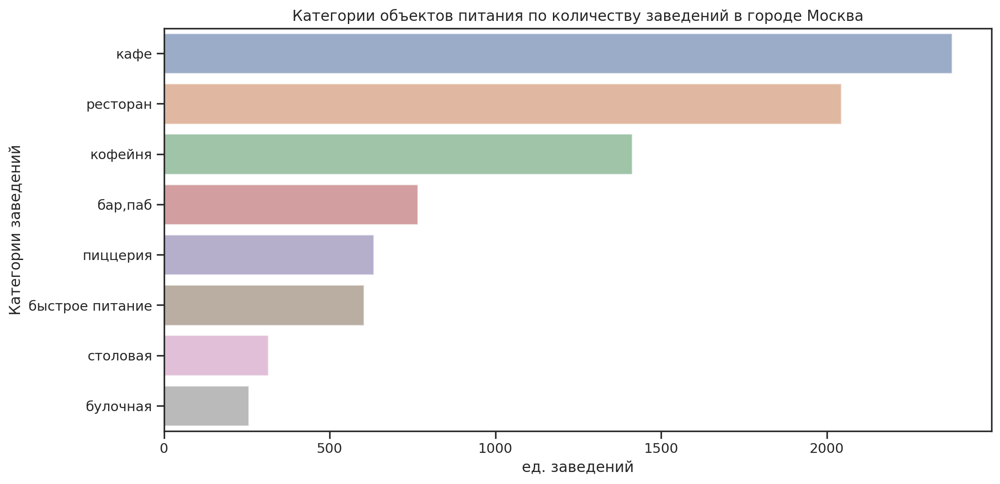

In [20]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='category', 
                 data=category, 
                 orient='h', alpha=0.6)
ax.set_title('Категории объектов питания по количеству заведений в городе Москва')
ax.set_xlabel('ед. заведений') 
ax.set_ylabel('Категории заведений')
plt.show()


Наглядно видно, что кафе и рестораны занимают 50% рынка, далее идут кофейни, меньше всего представленно булочных.

Теперь посмотрим, как идет распределение посадочных мест в заведениях по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализацию.

In [21]:
seats = data
seats['seats'] = seats['seats'].fillna('-1')
seats['seats'] = seats['seats'].astype(int)
seats.isna().sum()
seats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   int64  
 14  street             8406 non-null   object 
 15  is_24/7            8406 non-null   bool   
dtypes: bool(1), float64(5), 

Я не стал заменять пропуски в колонке seats в основном датафрейме, для анализа я сделал отдельный. В нем я заменил пропуски на -1, и взял за основу данные, где указано количество мест > 0 , т.е. воспользовался заглушкой. Далее привел эту колонку к значению int получил следующие данные, только для заведений, где количество мест было действительно указано.

In [22]:
seats = seats.query('seats > 0').groupby('category').agg({'seats' : 'median','name' : 'count'}).reset_index()
seats.columns = ['category', 'seats_median', 'total_count']
seats['seats_mean'] = seats['seats_median'].round()

seats = seats.sort_values(by='seats_median', ascending=False)


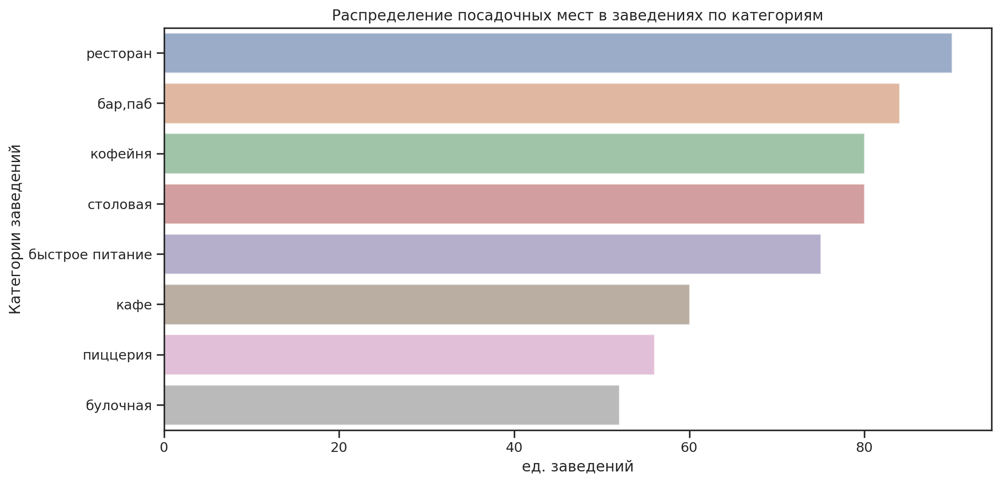

In [23]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='seats_median', y='category', 
                 data=seats, 
                 orient='h', alpha=0.6)
ax.set_title('Распределение посадочных мест в заведениях по категориям')
ax.set_xlabel('ед. заведений') 
ax.set_ylabel('Категории заведений')
plt.show()

Итак, больше всего мест есть в пабах и ресторанах, поменьше булочных и пиццериях.

Давайте теперь посмотрим соотношение сетевых и несетевых заведений в датасете.

In [24]:
chain = data.groupby('chain').agg(count=('name','count')).reset_index()
chain

,chain,count
0,0,5201
1,1,3205


Обычный заведений в Москве больше, почти в 2 раза.

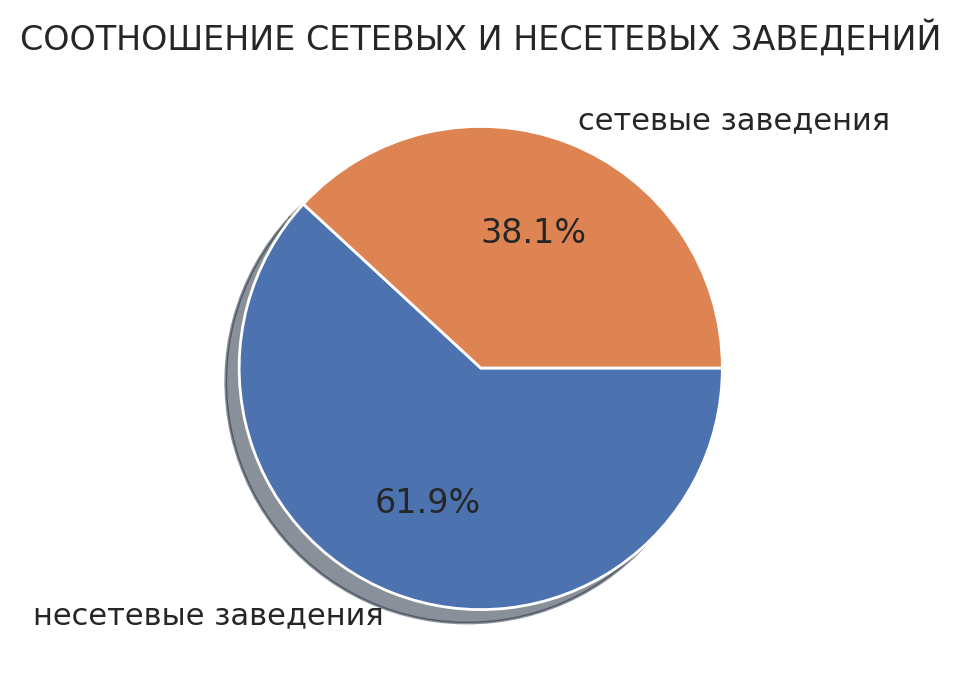

In [25]:
plt.figure(figsize=(4,4))
plt.pie(chain['count'],
        labels=chain['chain'].map({True: 'сетевые заведения', False: 'несетевые заведения'}), 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ')
plt.show()

А точнее, несетвых 61,9 % против 38,1%.

И тут возникает вопрос : какие категории заведений чаще являются сетевыми?  Давайте попробуем на него ответить с помощью графика:

In [26]:
category_chain = (
    data.query('chain == 1')
    .groupby('category')
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)

category_chain['percent'] = category_chain['count'] / sum(category_chain['count']) * 100

category_chain

,category,count,percent
3,кафе,779,24.305772
6,ресторан,730,22.776911
4,кофейня,720,22.464899
5,пиццерия,330,10.296412
2,быстрое питание,232,7.238690
0,"бар,паб",169,5.273011
1,булочная,157,4.898596
7,столовая,88,2.745710


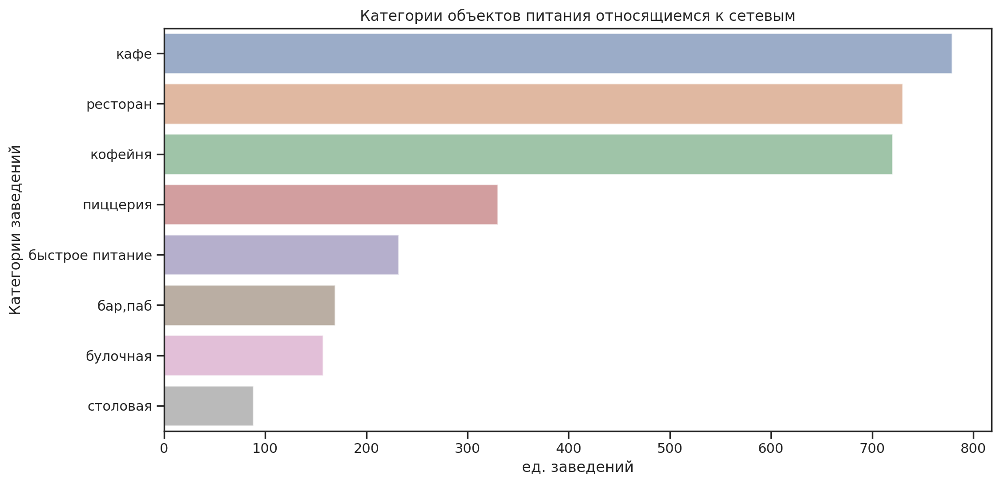

In [27]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='category', 
                 data=category_chain, 
                 orient='h', alpha=0.6)
ax.set_title('Категории объектов питания относящиемся к сетевым')
ax.set_xlabel('ед. заведений') 
ax.set_ylabel('Категории заведений')
plt.show()

Больше всего кафе, ресторанов и кофеин. А вот столовых самое меньшее количество.

In [28]:
data_chain_type = data.groupby('category').agg({'chain' : 'sum',
                                'name' : 'count'}).reset_index()
data_chain_type.columns = ['category', 'chain_count', 'total_count']
data_chain_type['%%'] = data_chain_type['chain_count'] / data_chain_type['total_count'] * 100
data_chain_type = data_chain_type.sort_values('chain_count', ascending=False)
display(data_chain_type.sort_values(by='%%', ascending=False))

,category,chain_count,total_count,%%
1,булочная,157,256,61.328125
5,пиццерия,330,633,52.132701
4,кофейня,720,1413,50.955414
2,быстрое питание,232,603,38.474295
6,ресторан,730,2043,35.731767
3,кафе,779,2378,32.758621
7,столовая,88,315,27.936508
0,"бар,паб",169,765,22.091503


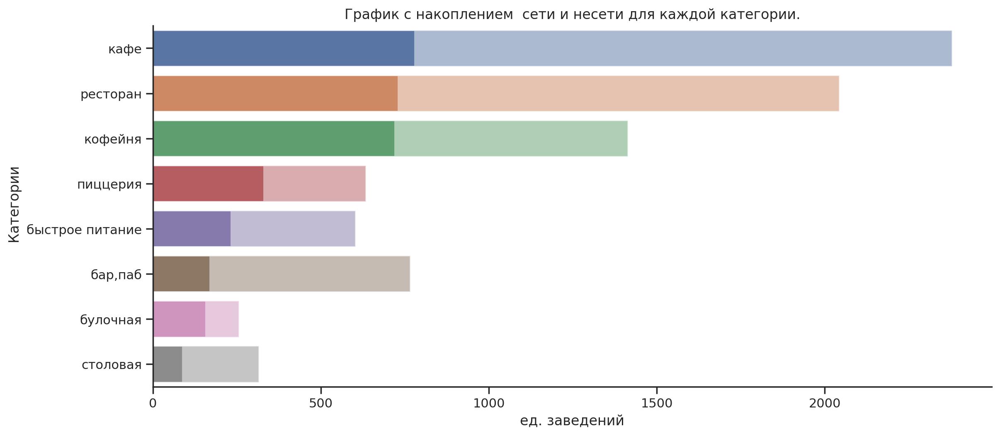

In [29]:
ax = sns.catplot(data=data_chain_type, 
                 kind="bar", 
                 x="chain_count", 
                 y="category",               
                 alpha=1, 
                 aspect=12/5)
ax1 = sns.barplot(x='total_count', y='category', data=data_chain_type, alpha=0.5,  orient='h')
ax.set_axis_labels('ед. заведений', ' Категории')
plt.title('График с накоплением  сети и несети для каждой категории.')
plt.show()


Выводы : самая большая доля у булочных, пиццерии и кофейни имеют равные доли, а вот бары, пабы и столовые обычно в частных руках. Если брать общее число заведений, то сетевых больше всего в категории кафе, рестораны и кофейни.

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. 

In [30]:
best_15 = (
     data.query('chain == 1')
    .groupby(['name', 'category'])
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False))
best_15 = best_15.head(15)
best_15

,name,category,count
1129,ШОКОЛАДНИЦА,кофейня,119
499,ДОМИНО'С ПИЦЦА,пиццерия,76
492,ДОДО ПИЦЦА,пиццерия,74
205,ONE PRICE COFFEE,кофейня,71
1145,ЯНДЕКС ЛАВКА,ресторан,69
72,COFIX,кофейня,65
241,PRIME,ресторан,49
620,КОФЕПОРТ,кофейня,42
635,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,39
966,ТЕРЕМОК,ресторан,36


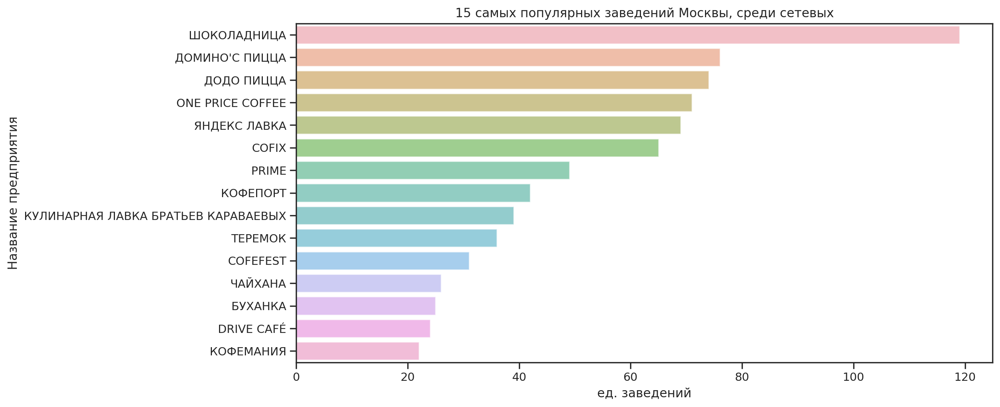

In [31]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='name', 
                 data=best_15, 
                 orient='h', alpha=0.6)
ax.set_title('15 самых популярных заведений Москвы, среди сетевых')
ax.set_xlabel('ед. заведений') 
ax.set_ylabel('Название предприятия')
plt.show()

Самый лидер это Шоколадница, у нее аж 119 заведений в Москве. Далее идут 2 пиццерии , потом опять кофейня и замыкает пятирку лидеров ресторан Яндекс Лавка. Из перечисленных заведений лично мне не знакомы :
- КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ	
- DRIVE CAFÉ
- PRIME

Но теперь есть цель, надо обязательно сходить, тем более их большое количество в городе.

В 15 лучших заведений представленны все, кроме столовых, баров, пабов и булочных.

Теперь посмотрим на заведения по административным районам.

In [32]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Итак, у нас 9 районов города.

Посмотрим, как распределены категории по районам.

In [33]:
district = (data.groupby(['district', 'category'])
    .agg(count=('district','count'))
    .reset_index()
    .sort_values('district' , ascending=False))
district

,district,category,count
71,Южный административный округ,столовая,44
70,Южный административный округ,ресторан,202
69,Южный административный округ,пиццерия,73
68,Южный административный округ,кофейня,131
67,Южный административный округ,кафе,264
66,Южный административный округ,быстрое питание,85
65,Южный административный округ,булочная,25
64,Южный административный округ,"бар,паб",68
59,Юго-Западный административный округ,кафе,238
56,Юго-Западный административный округ,"бар,паб",38


In [34]:
fig = px.histogram( data, 
                   x = 'district' ,
                   color = 'category',
                   title = 'Заведения по частоте расположения в районах Москвы',
                   nbins = 1000,
                   barmode = 'overlay')
fig.update_xaxes(title_text = 'Район')
fig.update_yaxes(title_text = 'Кол-во заведений')
fig.show()        

Итак, мы видим, что больше всего заведений в ЦАО. И это рестораны. Далее идут кафе и кофейни. Остальные районы примерно на одном уровне, кроме СЗАО, там маловато заведений. По этим остальным преобладают везде кафе, далее рестораны.

Давайте теперь посмотрим визуальное распределение средних рейтингов по категориям заведений. И узнаем сильно ли различаются усреднённые рейтинги в разных типах общепита.

In [35]:
fig = px.histogram( data, 
                   x = 'rating' ,
                   color = 'category',
                   title = 'Распределение средних рейтингов по категориям заведений',
                   nbins = 10,
                   barmode = 'overlay')
fig.update_xaxes(title_text = 'Категория заведения')
fig.update_yaxes(title_text = 'Кол-во заведений')
fig.show()  

Итак, среди отличников лидируют кафе : 172 предприятия с оценкой 4,8 - 5. На втором месте рестораны, далее кофейни.
Чаще всего средняя оценка находится в диаопозоне 4,3-4,7 баллов, тут лидер рестораны, далее кафе, далее кофейни.

Теперь построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [36]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values('rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [37]:
from folium import Map, Choropleth

In [38]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [39]:
state_geo = '/datasets/admin_level_geomap.geojson'

In [40]:
moscow_lat, moscow_lng = 55.751244, 37.618423

In [41]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [42]:
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

ЦАО рейтинг выше всех, далее идет САО, а вот ниже всех рейтинг у ЮВАО.

Теперь отобразим все заведения датасета на карте с помощью кластеров.

In [43]:
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
data.apply(create_clusters, axis=1)
m

И заведений в ЦАО больше всего и рейтинг хороший. Может стоит туда переехать?

Теперь посмотрим, на каких улицах больше всего заведений. 

In [44]:
street = data.groupby('street').agg(count=('name','count')).sort_values('count', ascending=False).reset_index()
top15_street = street.head(15)
top15_street

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Ого, мой любимый Проспект Мира явно лидирует.

А если графиком:

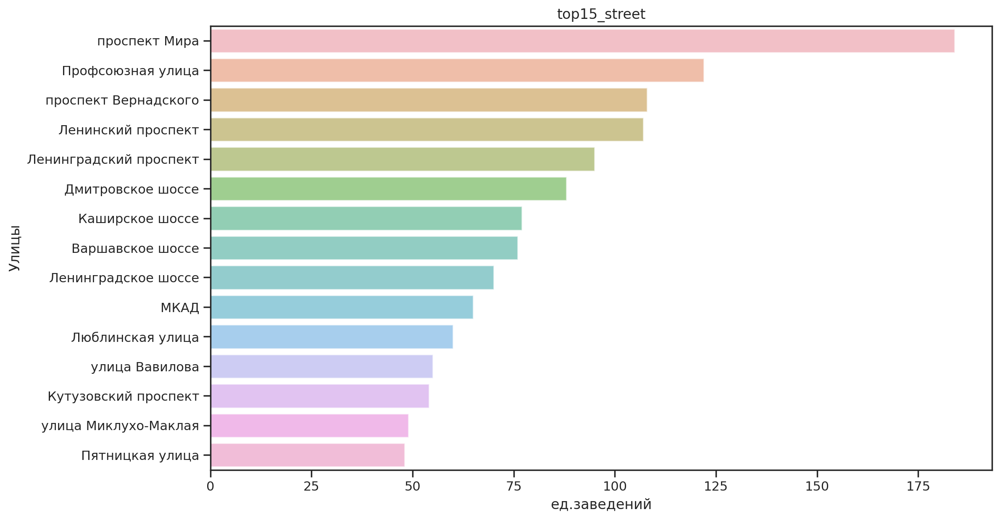

In [45]:
plt.figure(figsize=(12, 7))
ax = sns.barplot(x='count', y='street', data=top15_street, alpha=0.6, orient='h')
ax.set_title('top15_street')
ax.set_xlabel('ед.заведений') 
ax.set_ylabel('Улицы') 
plt.show()

Теперь попробуем наложить на заведения еще и категорию:

In [46]:
top15_street_category = data[data['street'].isin(top15_street['street'].unique())]


fig = px.histogram( top15_street_category, 
                   x = 'street' ,
                   color = 'category',
                   title = 'top15_street_category',
                   nbins = 10,
                   barmode = 'overlay')
fig.update_xaxes(title_text = 'Категория заведения')
fig.update_yaxes(title_text = 'Кол-во заведений')
fig.show() 

Теперь посмотрим на улицы одиночки, где всего представлено 1 заведение.

In [47]:
alone_street = data.groupby('street').agg(count=('name','count')).sort_values('count', ascending=False).reset_index()
alone_street = alone_street.query('count == 1')
alone_street

,street,count
990,улица Фотиевой,1
991,улица Фадеева,1
992,улица Кирпичные Выемки,1
993,сад Эрмитаж,1
994,улица Ивана Франко,1
995,улица Капотня,1
996,улица Шухова,1
997,улица Ильинка,1
998,улица Юннатов,1
999,улица Академика Комарова,1


In [48]:
alone_street.sum()

street    улица Фотиевойулица Фадееваулица Кирпичные Выемкисад Эрмитажулица Ивана Франкоулица Капотняулица Шуховаулица Ильинкаулица Юнна...
count                                                                                                                                   458
dtype: object

Большой однако список, 458 грустных улиц.

In [49]:
alone_street_category = data[data['street'].isin(alone_street['street'].unique())]

In [50]:
print(alone_street_category.groupby(['district', 'category'])['street'].count()
    .reset_index()
    .sort_values('street', ascending=False))

                                   district         category  street
39       Центральный административный округ             кафе      38
42       Центральный административный округ         ресторан      36
40       Центральный административный округ          кофейня      34
36       Центральный административный округ          бар,паб      23
59             Южный административный округ             кафе      22
46     Юго-Восточный административный округ             кафе      20
18          Северный административный округ             кафе      20
2          Восточный административный округ             кафе      18
25  Северо-Восточный административный округ             кафе      16
28  Северо-Восточный административный округ         ресторан      14
10          Западный административный округ             кафе      13
19          Северный административный округ          кофейня      13
26  Северо-Восточный административный округ          кофейня      10
53      Юго-Западный административ

Больше всего улиц с одним заведением в ЦАО, а если смотреть по категориям по городу, то на улице чаще встречается одно кафе, чем булочная.

In [51]:
fig = px.histogram( alone_street_category, 
                   x = 'district' ,
                   color = 'category',
                   title = 'Заведения по частоте расположения в районах Москвы',
                   nbins = 1000,
                   barmode = 'overlay')
fig.update_xaxes(title_text = 'Район')
fig.update_yaxes(title_text = 'Кол-во заведений')
fig.show()    

Теперь сделаем анализ средних чеков по заведениям.

Т.к. данные в колонке middle_avg_bill имеют пропуски и мы имеем инфу всего для 3149 строк, то их и будем анализировать.

Воспользуемся опять заглушкой.

In [52]:
middle_avg_bill = data
middle_avg_bill['middle_avg_bill'] = middle_avg_bill['middle_avg_bill'].fillna('-1')
middle_avg_bill['middle_avg_bill'] = middle_avg_bill['middle_avg_bill'].astype(int)

In [53]:
district_bill = middle_avg_bill.query('middle_avg_bill > 0').groupby('district').agg({'middle_avg_bill' : 'median',
                                'name' : 'count'}).reset_index()
district_bill.columns = ['district', 'bill_median', 'total_count']
district_bill['bill_median'] = district_bill['bill_median'].round()

district_bill.sort_values(by='bill_median', ascending=False)



,district,bill_median,total_count
1,Западный административный округ,1000,306
5,Центральный административный округ,1000,1059
4,Северо-Западный административный округ,700,157
2,Северный административный округ,650,322
7,Юго-Западный административный округ,600,235
0,Восточный административный округ,575,260
3,Северо-Восточный административный округ,500,301
8,Южный административный округ,500,314
6,Юго-Восточный административный округ,450,194


Итак, центр и ЗАО самые дорогие по чеку, дешевле всего перекусить в ЮВАО.

Наложим эти данные на карту.

In [54]:
n = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [55]:
Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'bill_median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(n)
n

Центр и новая Москва самые дорогие, Юг и Север дешевле всего.

Итак общий вывод по пункту 3.

В нашем датафрейме представленны 8 категорий общественного питания:

- кафе
- ресторан
- кофейня
- бар, паб
- пиццерия
- быстрое питание
- столовая
- булочная
Заведения указаны в порядке убывания их доли на рынке, самое большое у кафе – 28%, самое маленькое у булочных – 3%.

Если брать наличие посадочных мест, то тут лидирует бар, паб со средним значением 126 мест, а замыкает список пиццерия с 97 местами.

Сетевых заведений в городе 38,1% против 61,9% обычных.

Чаще всего сетевые заведения это кафе ( 24%) , рестораны ( 23%) и кофейни (22%).

Топ-15 самых популярных кафе по количеству представленных в Москве выглядит следующим образом:

 category	count
- ШОКОЛАДНИЦА	кофейня	119
- ДОМИНО'С ПИЦЦА	пиццерия	76
- ДОДО ПИЦЦА	пиццерия	74
- ONE PRICE COFFEE	кофейня	71
- ЯНДЕКС ЛАВКА	ресторан	69
- COFIX	кофейня	65
- PRIME	ресторан	49
- КОФЕПОРТ	кофейня	42
- КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ	кафе	39
- ТЕРЕМОК	ресторан	36
- COFEFEST	кофейня	31
- ЧАЙХАНА	кафе	26
- БУХАНКА	булочная	25
- DRIVE CAFÉ	кафе	24
- КОФЕМАНИЯ	кофейня	22
		


Самый лидер это Шоколадница, у нее аж 119 заведений в Москве. Далее идут 2 пиццерии , потом опять кофейня и замыкает пятирку лидеров ресторан Яндекс Лавка. Из перечисленных заведений лично мне не знакомы :
- КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ	
- DRIVE CAFÉ
- PRIME

В 15 лучших заведений представлены все, кроме столовых, баров, пабов и булочных.

У нас город поделен на 9 районов.

Больше всего заведений в ЦАО. И это рестораны. Далее идут кафе и кофейни. Остальные районы примерно на одном уровне, кроме СЗАО, там маловато заведений. По этим остальным преобладают везде кафе, далее рестораны.

Если смотреть на распределение средних рейтингов по категориям заведений, то среди отличников лидируют кафе : 172 предприятия с оценкой 4,8 - 5. На втором месте рестораны, далее кофейни. Чаще всего средняя оценка находится в диаопозоне 4,3-4,7 баллов, тут лидер рестораны, далее кафе, далее кофейни.

По рейтинг районов ЦАО рейтинг выше всех, далее идет САО, а вот ниже всех рейтинг у ЮВАО.

Самое большое заведений на улице Проспект Мира ( 184), далее Профсоюзная улица ( 122), тройку замыкает проспект Вернадского ( 108).

Так же в Москве есть 458 улиц, на которых есть всего 1 заведение питания.

Больше всего улиц с одним заведением в ЦАО, а если смотреть по категориям по городу, то на улице чаще встречается одно кафе, чем булочная.

Итак, центр и ЗАО самые дорогие по чеку (1000), дешевле всего перекусить в ЮВАО ( 450).


###  Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Сейчас мы попробуем определить, осуществима ли мечта клиентов.

Посмотрим, сколько всего у нас кофеин.

In [56]:
coffee_house =  data.query('category == "кофейня"')

In [57]:
coffee_house_qty = (
    coffee_house
    .groupby('category')
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)


coffee_house_qty

,category,count
0,кофейня,1413


1413, цифра не маленькая, но если учитывать население Москвы в 13 млн человек, то это 1 кофейня на 9200 человек. 

Посмотрим, в каких районах кофеин больше, а в каких не очень.

In [58]:
district_coffee = (coffee_house.groupby('district')
    .agg(count=('district','count'))
    .reset_index()
    .sort_values('count' , ascending=False))
district_coffee

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


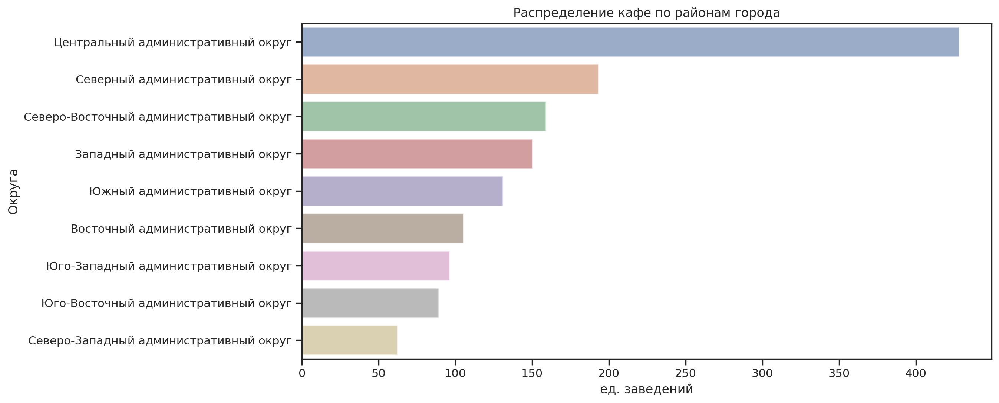

In [59]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='district', 
                 data=district_coffee, 
                 orient='h', alpha=0.6)
ax.set_title('Распределение кафе по районам города')
ax.set_xlabel('ед. заведений') 
ax.set_ylabel('Округа')
plt.show()

Больше всего кафе в центре, тут явный перевес. 

Посмтотрим, всегла ли кофейни доступны, можем ли мы ходить в них круглосуточно?

In [60]:
aye_coffee = (coffee_house.groupby('is_24/7')
    .agg(count=('is_24/7','count'))
    .reset_index()
    .sort_values('count' , ascending=False))
aye_coffee

,is_24/7,count
0,False,1354
1,True,59


Всего 59 кафе на всю Мосвку!

Теперь займемся рейтингами кафе и распределением по районам.

In [61]:
rating_coffee = coffee_house.groupby('district', as_index=False)['rating'].agg('mean').sort_values('rating', ascending=False)
rating_coffee

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [62]:
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [63]:
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кафе по районам',
).add_to(c)
c

Лучше всех оценивают ЦАО и СЗАО, а вот у ЗАО дела обстоят похуже.

В кофейню приходят попить кофе, поэтому мы конечно же посмотрим, средний чек на чашку капучино.

In [64]:
coffee_house.isna().sum()

name                   0
category               0
address                0
district               0
hours                 15
lat                    0
lng                    0
rating                 0
price                937
avg_bill             692
middle_avg_bill        0
middle_coffee_cup    892
chain                  0
seats                  0
street                 0
is_24/7                0
dtype: int64

У нас 892 пропуска из 1413 строк... Чтож не так много у нас данных, но построим по ним среднуюю.

In [65]:
coffee_house['middle_coffee_cup'] = coffee_house['middle_coffee_cup'].fillna('-1')
coffee_house['middle_coffee_cup'] = coffee_house['middle_coffee_cup'].astype(int)
coffee_house.isna().sum()

name                   0
category               0
address                0
district               0
hours                 15
lat                    0
lng                    0
rating                 0
price                937
avg_bill             692
middle_avg_bill        0
middle_coffee_cup      0
chain                  0
seats                  0
street                 0
is_24/7                0
dtype: int64

In [66]:
coffee_house  = coffee_house.query('middle_coffee_cup > 0').groupby('district').agg({'middle_coffee_cup' : 'mean',
                                'name' : 'count'}).reset_index()
coffee_house.columns = ['district', 'cup_mean', 'total_count']
coffee_house['cup_mean'] = coffee_house['cup_mean'].round()

coffee_house = coffee_house.sort_values(by='cup_mean', ascending=False)

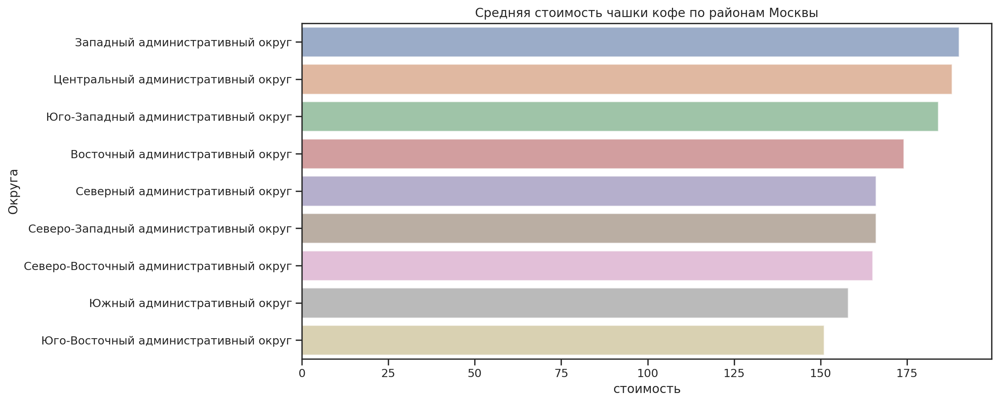

In [67]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='cup_mean', y='district', 
                 data=coffee_house, 
                 orient='h', alpha=0.6)
ax.set_title('Средняя стоимость чашки кофе по районам Москвы')
ax.set_xlabel('стоимость') 
ax.set_ylabel('Округа')
plt.show()

Самая дорогая чашка кофе в ЗАО и ЦАО, а вот сэкономить можно в ЮВАО, но самих кофеин там не так уж и много, придется поискать.

Выводы и рекомендации.

Итак, если наши друзья из фонда Shut Up and Take My Money собираются открыть кофейню, то я однозначно им это рекомендую.

В Москве всего 1413 кофеин, цифра не маленькая, но если учитывать население Москвы в 13 млн человек, то это 1 кофейня на 9200 человек.

Самое большее число кофеин в ЦАО, так что лучше присмотреться к СЗАО, ЮВАО или ЮЗАО, их там меньше в разы, а значит конкуренция будет не такая большая.

Т.к. в Москве всего 59 круглосуточных кафе, я думаю можно обратить на это внимание, особенно если будет доступ к большой автомобильной дороге, чтобы ночные водители смогли пользоваться кофейней не выходя из авто.

Рейтинг самый низкий у ЗАО, СВАО и ЮВАО, обратить внимание опять на ЮВАО, т.к. мы уже поняли , что их там мало, к тому же и рейтинг ниже , чем в других округах, а значит клиенты захотят попробовать новенькое, все равно достойных не так уж и много.

Средний чек чашки капучино начинается от 151 рубля в ЮВАО и доходит до 190 рублей в центре. А т.к. мы присматриваемся к ЮВАО, то надо заложить в бизнес модель, что цена не должна быть высокой.
С другой стороны, возможно поэтому и рейтинги плохие, т.к. дешевый кофе может быть и с плохим сервисом. Тут наглядный пример Центр, кофе тут дороже всего, но и рейтинг самый высокий. А т.к. кофеин тут больше всего, то нужно быть готовым к конкуренции.


Презентация: <ссылка на облачное хранилище с презентацией : https://disk.yandex.ru/i/Pl6bPSPIlHOTFw> 